In [1]:
import os,sys
import datetime
import scanpy as sc
import numpy as np
import pandas as pd

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.patches as patches
import json

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.patches as patches
from matplotlib import cm
from matplotlib.lines import Line2D
from matplotlib.offsetbox import AnchoredOffsetbox, TextArea, HPacker, VPacker
import json

In [4]:
# add the utility function folder to PATH
sys.path.append(os.path.abspath("utility_functions_190403_12h24/"))

from rz_import_statements import *
import rz_functions as rz
import rz_utility_spring as srz

python version: 3.8.12


## Loading data

In [5]:
adata = sc.read_h5ad('backups_JZ_2022/clean_kidney_304_15tr_25c_batch_corrected_50236x2000_220315_12h14.h5ad') 

In [6]:
#taking all the genes, not only variable ones
adata = adata.raw.to_adata()

In [7]:
adata

AnnData object with n_obs × n_vars = 50236 × 33538
    obs: 'library', 'total_counts', 'pct_counts_mito', 'library2', 'sample', 'patient', 'pT stage', 'seq_date', 'beads', 'operation', 'sex', 'tumor size, mm', 'age', 'tissue', 'necrosis', 'doublet_score', 'potential_doublet', 'top3pct_dbtl_score', 'top5pct_dbtl_score', 'top10pct_dbtl_score', 'closest_JZ_kidney', 'closest_JZ_kidney_hvg', 'removed_as_RBC', 'removed_as_dblt1', 'removed_as_dblt2', 'n_counts', 'no_dblt_no_rbc'
    uns: 'X_lin_cptt', 'X_log_z', 'beads_colors', 'draw_graph', 'neighbors', 'pca', 'sample_colors', 'seq_date_colors', 'tissue_colors', 'umap'
    obsm: 'X_draw_graph_fa', 'X_pca', 'X_pca_harmony', 'X_umap'

### Note: 
Since figure making, as everything else in analysis, is a highly iterative process, below I am loading an obs file that already contains information for colors for each labeling plotted. However, below, the code to assign colors to obs directly from SPRING app is added nevertheless.
Also, at the end of this notebook there are some changes assigned because 2 labels of samples were mixed up - note that does not change anything prior analysis.

In [8]:
#load latest obs
filename = 'backups_JZ_2022/corrected_obs_info_50236x32_221012_12h04.npz'
encoding = 'latin1'

with np.load(filename,encoding=encoding, allow_pickle = True) as f:
    obs = pd.DataFrame(**f)
adata.obs=obs
adata.obs

,library,total_counts,pct_counts_mito,library2,sample,patient,pT stage,seq_date,beads,operation,...,n_counts,no_dblt_no_rbc,sp_cl_43,cell_type,broad_cell_type,color,cell_group,stage_color,patient_color,group_color
2,N14,449,0.668151,T2_1,T2,P2,pT3a,20_11_12,old,Open,...,449,True,40,TAM 4,Immune,#9a5ce0,Myeloid cells,#8c1a1a,#e87f7f,#85619c
19,N14,449,4.23163,T2_1,T2,P2,pT3a,20_11_12,old,Open,...,449,True,37,TAM 3,Immune,#943886,Myeloid cells,#8c1a1a,#e87f7f,#85619c
363,N14,1229,10.6591,T2_1,T2,P2,pT3a,20_11_12,old,Open,...,1229,True,22,Tumor cells 2,Tumor,#b06c6c,Tumor cells,#8c1a1a,#e87f7f,#db2f2c
433,N14,432,6.94444,T2_1,T2,P2,pT3a,20_11_12,old,Open,...,432,True,27,Tumor cells 3,Tumor,#db2f2c,Tumor cells,#8c1a1a,#e87f7f,#db2f2c
444,N14,502,4.98008,T2_1,T2,P2,pT3a,20_11_12,old,Open,...,502,True,28,Tumor vasculature 4,Endothelial,#a35927,Endothelium,#8c1a1a,#e87f7f,#e07c57
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4865536,Tumor0228,683,9.37042,T4_old,T4,P4,pT3a,old,old,Open,...,683,True,30,TAM 2,Immune,#532b6b,Myeloid cells,#8c1a1a,#70c3d4,#85619c
4865584,Tumor0228,1473,6.51731,T4_old,T4,P4,pT3a,old,old,Open,...,1473,True,30,TAM 2,Immune,#532b6b,Myeloid cells,#8c1a1a,#70c3d4,#85619c
4865642,Tumor0228,498,9.43775,T4_old,T4,P4,pT3a,old,old,Open,...,498,True,37,TAM 3,Immune,#943886,Myeloid cells,#8c1a1a,#70c3d4,#85619c
4865726,Tumor0228,421,19.2399,T4_old,T4,P4,pT3a,old,old,Open,...,421,True,27,Tumor cells 3,Tumor,#db2f2c,Tumor cells,#8c1a1a,#70c3d4,#db2f2c


## Making the figures editable in illustrator and setting params


In [9]:
import matplotlib as mpl
mpl.rc('font',family='Arial')
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

## Assigning some colors from the SPRING app


In [10]:
#taking the colors from interactive SPRING 
# SPRING plot path
path1 = '/Users/justina/Documents/mokslai/MAGISTRAS/MAGISTRINIS/data_and_spring/SPRING_dev-master/kidney_spring/' 
project_dir = path1+'kidney_2022/'
plot_name =  'clean_kidney_304_15tr_25c'


In [11]:
def read_cell_groupings(path='categorical_coloring_data.json'):
    with open(path, encoding = 'utf8') as json_data:
        d = json.load(json_data)
    return d

In [12]:
# load current color dictionary
cg0 = read_cell_groupings(project_dir+plot_name+'/categorical_coloring_data.json.backup_221012_13h37')

# color dictionary of dictionaries
cdd = {key:value['label_colors'] for key,value in cg0.items()}

In [13]:
cdd.keys()

dict_keys(['age', 'beads', 'broad_cell_type', 'cell_type', 'closest_JZ_kidney', 'closest_JZ_kidney_hvg', 'doublet_score', 'library', 'library2', 'louvain_res_1.0', 'louvain_res_2.0', 'louvain_res_3.0', 'louvain_res_4.0', 'louvain_res_5.0', 'louvain_resolution_30.0', 'louvain_resolution_50.0', 'louvain_resolution_60.0', 'louvain_resolution_80.0', 'n_counts', 'necrosis', 'no_dblt_no_rbc', 'operation', 'pT stage', 'patient', 'pct_counts_mito', 'pheno_leiden', 'pheno_leiden_res_0.5', 'pheno_leiden_res_0.8', 'pheno_leiden_res_1.0', 'pheno_leiden_res_1.5', 'pheno_leiden_res_2.0', 'pheno_leiden_res_2.5', 'pheno_leiden_res_3.0', 'pheno_leiden_res_3.5', 'pheno_leiden_res_4.0', 'potential_doublet', 'removed_as_RBC', 'removed_as_dblt1', 'removed_as_dblt2', 'sample', 'seq_date', 'sex', 'sp_cl_38', 'sp_cl_39', 'sp_cl_40', 'sp_cl_42', 'sp_cl_43', 'sp_cl_45', 'sp_cl_47', 'sp_cl_50', 'tissue', 'top10pct_dbtl_score', 'top3pct_dbtl_score', 'top5pct_dbtl_score', 'total_counts', 'tumor size, mm'])

... storing 'library' as categorical
... storing 'library2' as categorical
... storing 'sample' as categorical
... storing 'patient' as categorical
... storing 'pT stage' as categorical
... storing 'seq_date' as categorical
... storing 'beads' as categorical
... storing 'operation' as categorical
... storing 'sex' as categorical
... storing 'tissue' as categorical
... storing 'necrosis' as categorical
... storing 'closest_JZ_kidney' as categorical
... storing 'closest_JZ_kidney_hvg' as categorical
... storing 'sp_cl_43' as categorical
... storing 'cell_type' as categorical
... storing 'broad_cell_type' as categorical
... storing 'color' as categorical
... storing 'cell_group' as categorical
... storing 'stage_color' as categorical
... storing 'patient_color' as categorical
... storing 'group_color' as categorical


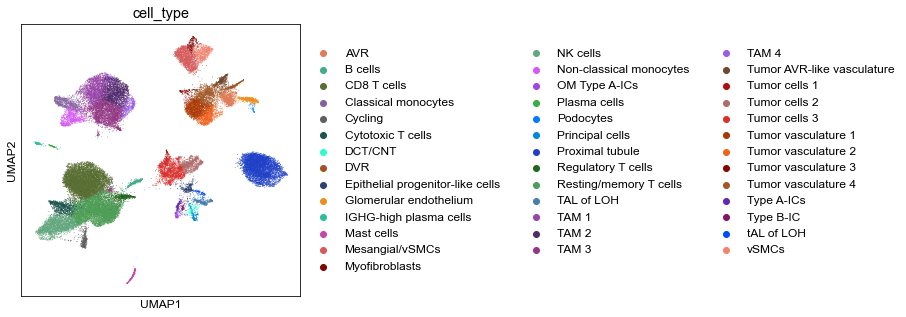

In [14]:
mpl.rcParams['figure.figsize'] = (5,5)
plt.rcParams.update({'font.size': 12})
sc.pl.umap(adata, color = 'cell_type', palette = cdd['cell_type'])

In [65]:
adata.obs.keys()

Index(['library', 'total_counts', 'pct_counts_mito', 'library2', 'sample',
       'patient', 'pT stage', 'seq_date', 'beads', 'operation', 'sex',
       'tumor size, mm', 'age', 'tissue', 'necrosis', 'doublet_score',
       'potential_doublet', 'top3pct_dbtl_score', 'top5pct_dbtl_score',
       'top10pct_dbtl_score', 'closest_JZ_kidney', 'closest_JZ_kidney_hvg',
       'n_counts', 'no_dblt_no_rbc', 'sp_cl_43', 'cell_type',
       'broad_cell_type', 'color', 'cell_group', 'stage_color',
       'patient_color', 'group_color'],
      dtype='object')

In [19]:
#adding color info to adata
adata.obs['color'] = [cdd['cell_type'][i] for i in adata.obs['cell_type']]

## Figure 1b: Main UMAP figure and legend

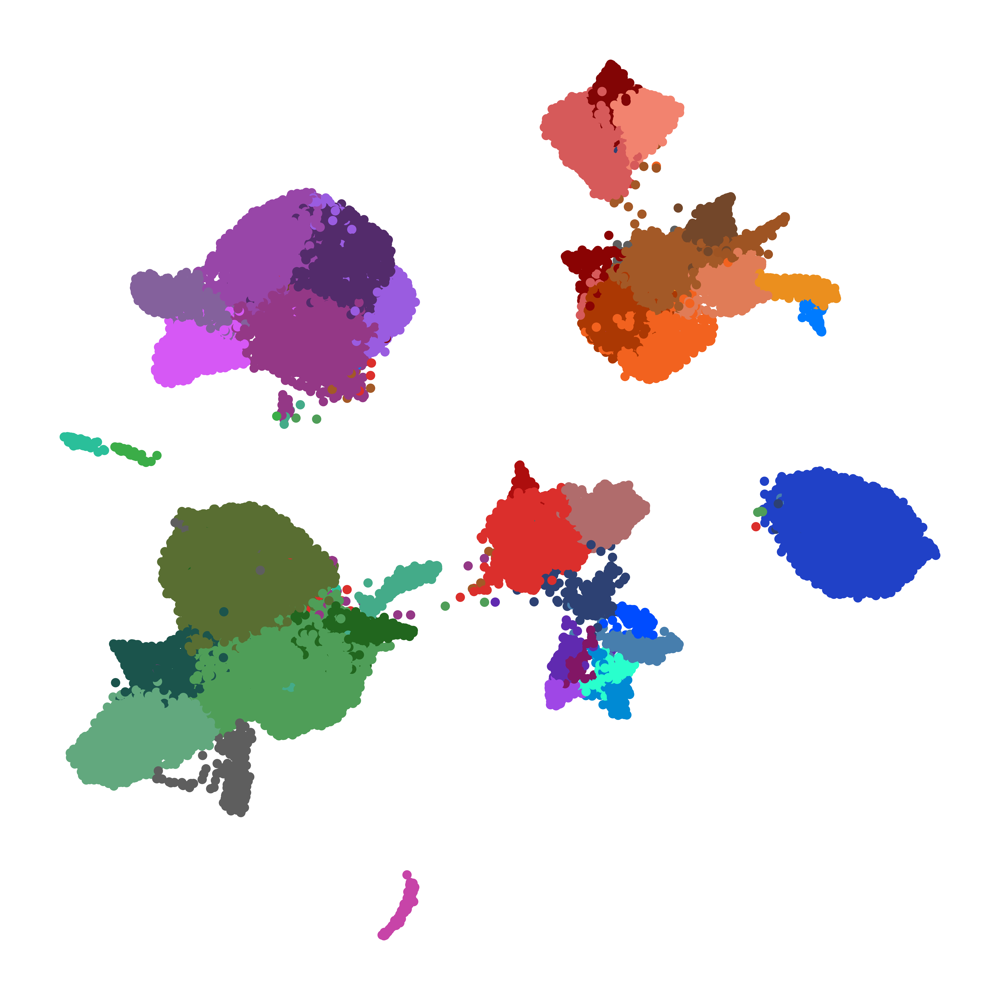

In [20]:
fig, ax = plt.subplots(figsize=(5, 5), frameon=False, dpi=1200)
ax1 = plt.scatter(adata.obsm['X_umap'][:, 0], adata.obsm['X_umap'][:, 1], color=adata.obs['color'],
            s=5) 
ax.axis('off')

#!mkdir figures_paper
plt.tight_layout()
plt.savefig('figures_paper/final_umap.png', transparent=True)

In [18]:
cell_type_dict_ordered = {
 #vasculature
 'AVR': '#e07c57',
 'DVR': '#9e5423',
 'Glomerular endothelium': '#eb8f1e',
 'Tumor AVR-like vasculature': '#73472a',
 'Tumor vasculature 1': '#ab3803',
 'Tumor vasculature 2': '#f2621f',
 'Tumor vasculature 3': '#8a0303',
 'Tumor vasculature 4': '#a35927',
 
#stromal cells
 'vSMCs': '#f2836f',
 'Mesangial/vSMCs': '#d65a5a',
 'Myofibroblasts': '#820505',

#epithelial
 'Proximal tubule': '#2041c7',
 'Podocytes': '#007bff',
 'tAL of LOH': '#004cff',
 'TAL of LOH': '#477ead',
 'DCT/CNT': '#29ffcd',
 'Principal cells': '#008ad4',
 'Type A-ICs': '#602ab0',
 'Type B-IC': '#821665',
 'OM Type A-ICs': '#9f47e6',
 'Epithelial progenitor-like cells': '#2d4173',

#tumor cells
 'Tumor cells 1': '#ad0e0e',
 'Tumor cells 2': '#b06c6c',
 'Tumor cells 3': '#db2f2c',
    
#myeloid
  'Classical monocytes': '#84619c',
  'Non-classical monocytes': '#d658f5',
 'TAM 1': '#9846a8',
 'TAM 2': '#532b6b',
 'TAM 3': '#943886',
 'TAM 4': '#9a5ce0',
  'Mast cells': '#c744a8',

#lymphoid
 'CD8 T cells': '#596e32',
 'Resting/memory T cells': '#4f9e58',
 'Cytotoxic T cells': '#1b544c',
 'Regulatory T cells': '#21661e',
  'NK cells': '#62a87e',    
 'B cells': '#44ab89',
 'Plasma cells': '#3bad48',
  'IGHG-high plasma cells': '#2abf9a',
#cycling
 'Cycling': '#5e5e5e',



 }

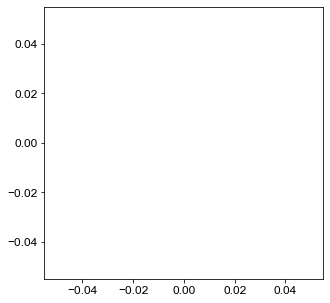

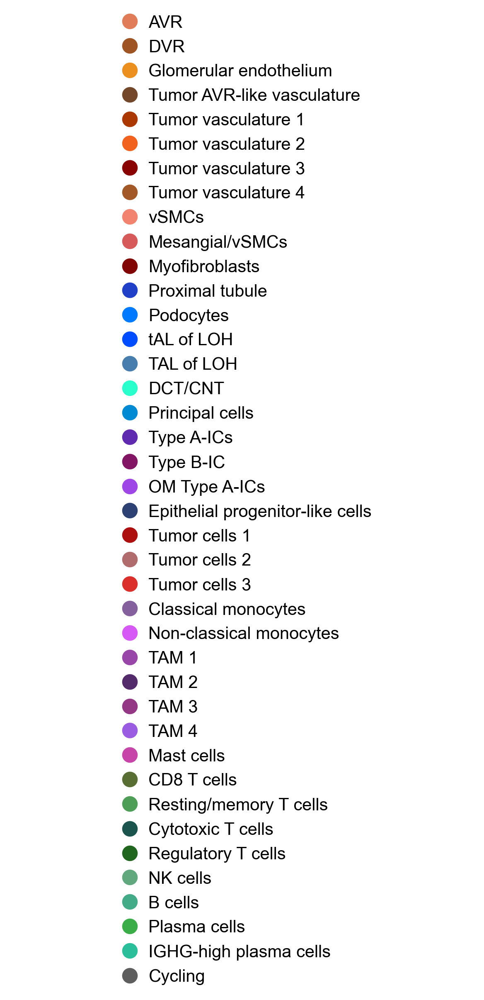

In [19]:
handles = []
for key, value in cell_type_dict_ordered.items():
    patch = plt.plot([], marker = 'o', ls = '', color=value, label=key, ms=5)[0]
    handles.append(patch)

fig, ax= plt.subplots(figsize=(6, 10), dpi=200, frameon=False)
ax.axis('off')
plt.legend(handles=handles, loc='center', frameon=False, markerscale=2.5,handletextpad=0.1, fontsize=15)
plt.tight_layout()
#plt.savefig('figures_paper/final_labels_umap.pdf', transparent=True)
#plt.savefig('figures_paper/final_labels_umap.pdf', transparent=True)

    

## Figure 1c: UMAPs colored by disease stage and patient ID

In [46]:
adata.obs.keys()

Index(['library', 'total_counts', 'pct_counts_mito', 'library2', 'sample',
       'patient', 'pT stage', 'seq_date', 'beads', 'operation', 'sex',
       'tumor size, mm', 'age', 'tissue', 'necrosis', 'doublet_score',
       'potential_doublet', 'top3pct_dbtl_score', 'top5pct_dbtl_score',
       'top10pct_dbtl_score', 'closest_JZ_kidney', 'closest_JZ_kidney_hvg',
       'n_counts', 'no_dblt_no_rbc', 'sp_cl_43', 'cell_type',
       'broad_cell_type', 'color', 'cell_group', 'stage_color',
       'patient_color', 'group_color'],
      dtype='object')

In [47]:
cdd['pT stage']

{'H_pT1a': '#477ead',
 'H_pT3a': '#477ead',
 'pT1a': '#c96a6a',
 'pT3a': '#8c1a1a'}

In [48]:
adata.obs['stage_color'] = [cdd['pT stage'][i] for i in adata.obs['pT stage']]

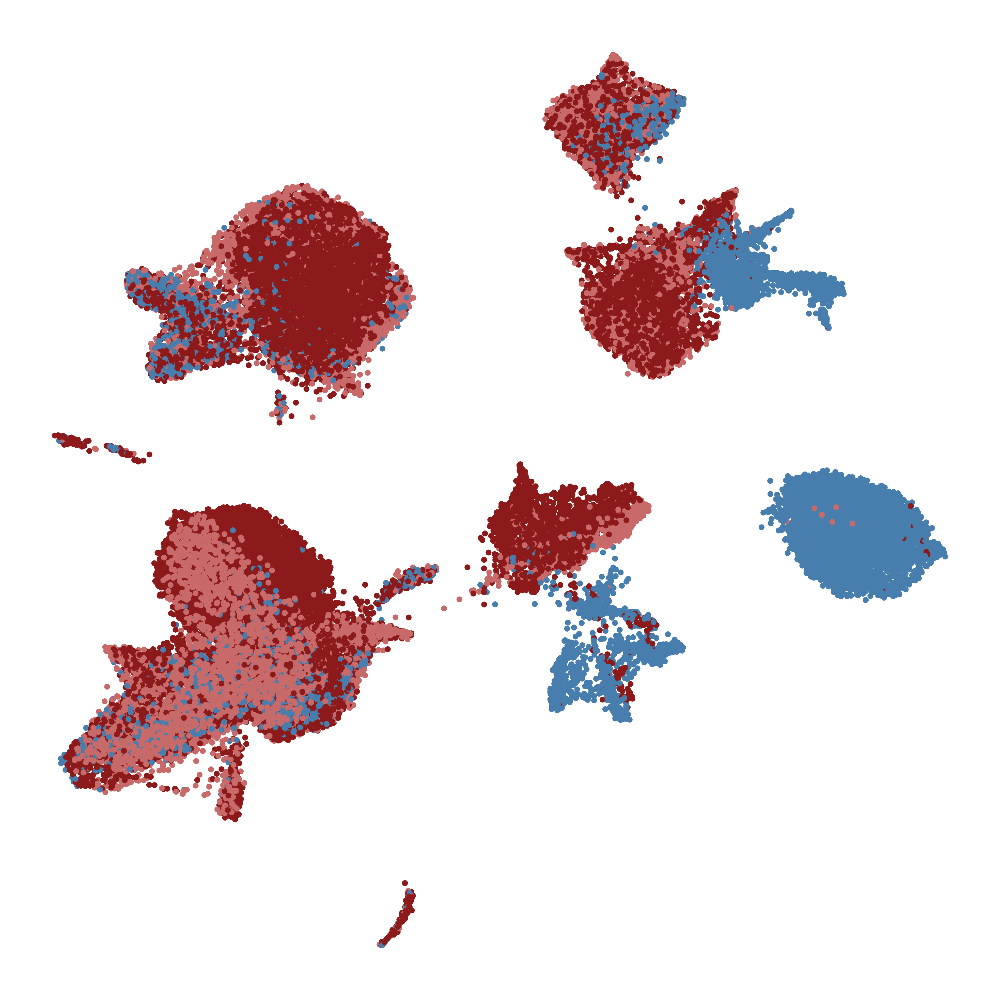

In [50]:
fig, ax = plt.subplots(figsize=(10, 10), frameon=False, dpi=400)
ax1 = plt.scatter(adata.obsm['X_umap'][:, 0], adata.obsm['X_umap'][:, 1], color=adata.obs['stage_color'],
            s=10) 
ax.axis('off')


#!mkdir figures_paper
plt.tight_layout()
plt.savefig('figures_paper/stages_umap.png', transparent=True)

In [42]:
cdd['pT stage']

{'H_pT1a': '#477ead',
 'H_pT3a': '#477ead',
 'pT1a': '#c96a6a',
 'pT3a': '#8c1a1a'}

In [43]:
for_legend = {
 'Adjacent healthy': '#477ead',
 'pT1a': '#c96a6a',
 'pT3a': '#8c1a1a'}

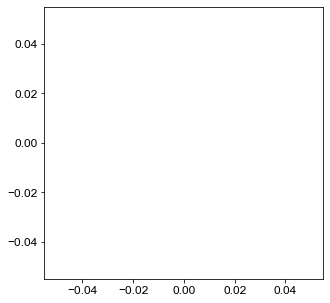

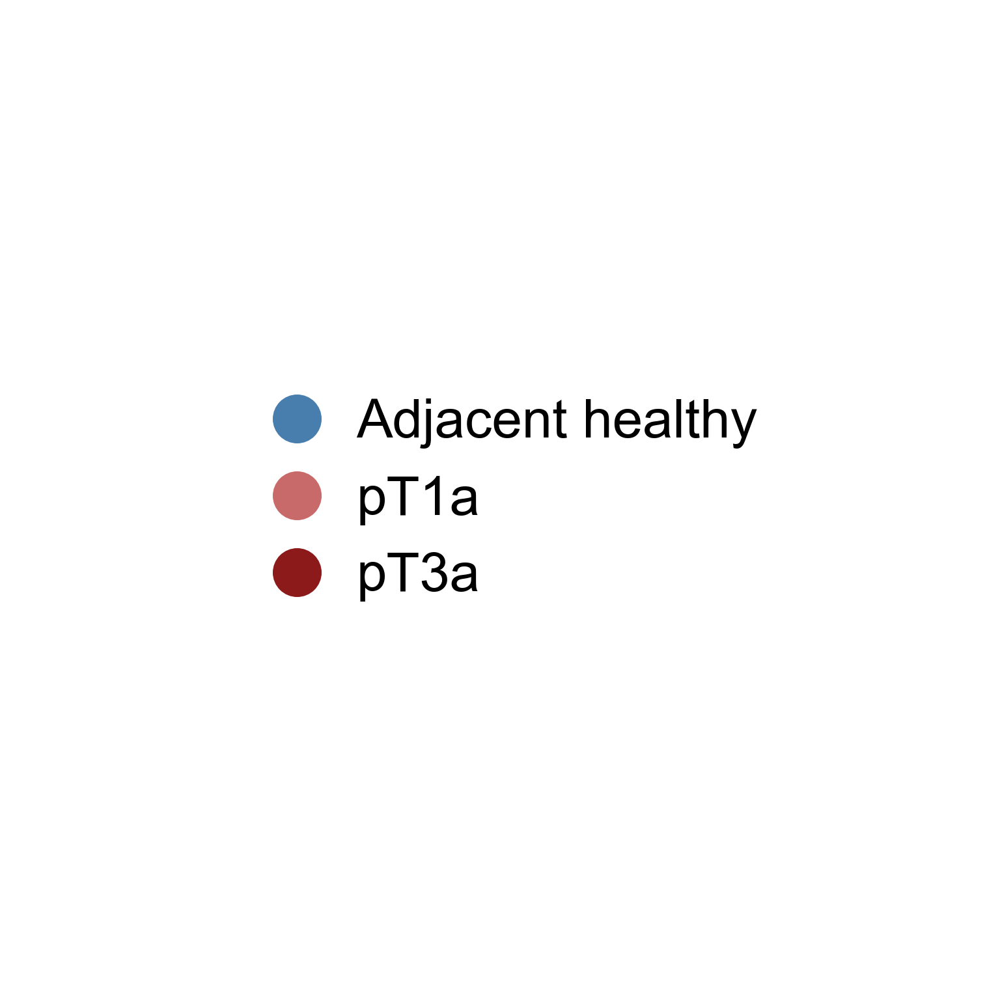

In [44]:
handles = []
for key, value in for_legend.items():
    patch = plt.plot([], marker = 'o', ls = '', color=value, label=key, ms=5)[0]
    handles.append(patch)

fig, ax= plt.subplots(figsize=(4, 4), dpi=400, frameon=False)
ax.axis('off')
plt.legend(handles=handles, loc='center', frameon=False, markerscale=2.5,handletextpad=0.1, fontsize=15)

plt.tight_layout()
plt.savefig('figures_paper/stages_legend_umap.pdf', transparent=True)


In [45]:
cdd['patient']

{'P1': '#44824f',
 'P2': '#e87f7f',
 'P3': '#6060d4',
 'P4': '#70c3d4',
 'P5': '#d1c56d',
 'P6': '#b54a43',
 'P7': '#6088c9',
 'P8': '#61b88e',
 'P9': '#a35fa1'}

In [46]:
adata.obs['patient_color'] = [cdd['patient'][i] for i in adata.obs['patient']]

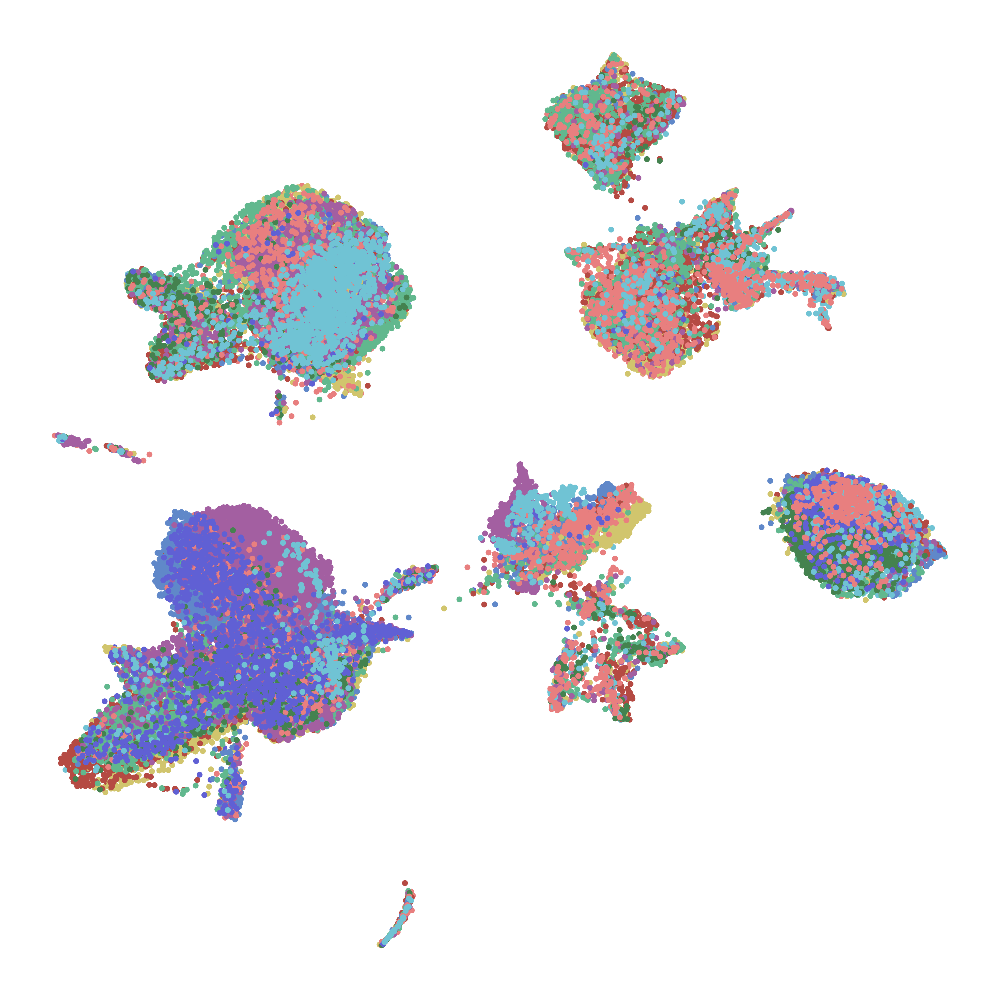

In [55]:
fig, ax = plt.subplots(figsize=(10, 10), frameon=False, dpi=400)
ax1 = plt.scatter(adata.obsm['X_umap'][:, 0], adata.obsm['X_umap'][:, 1], color=adata.obs['patient_color'],
            s=10) 
ax.axis('off')


#!mkdir figures_paper
plt.tight_layout()
plt.savefig('figures_paper/patient_umap_hq.png', transparent=True)

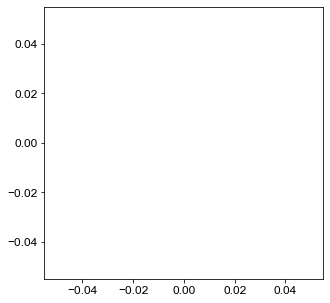

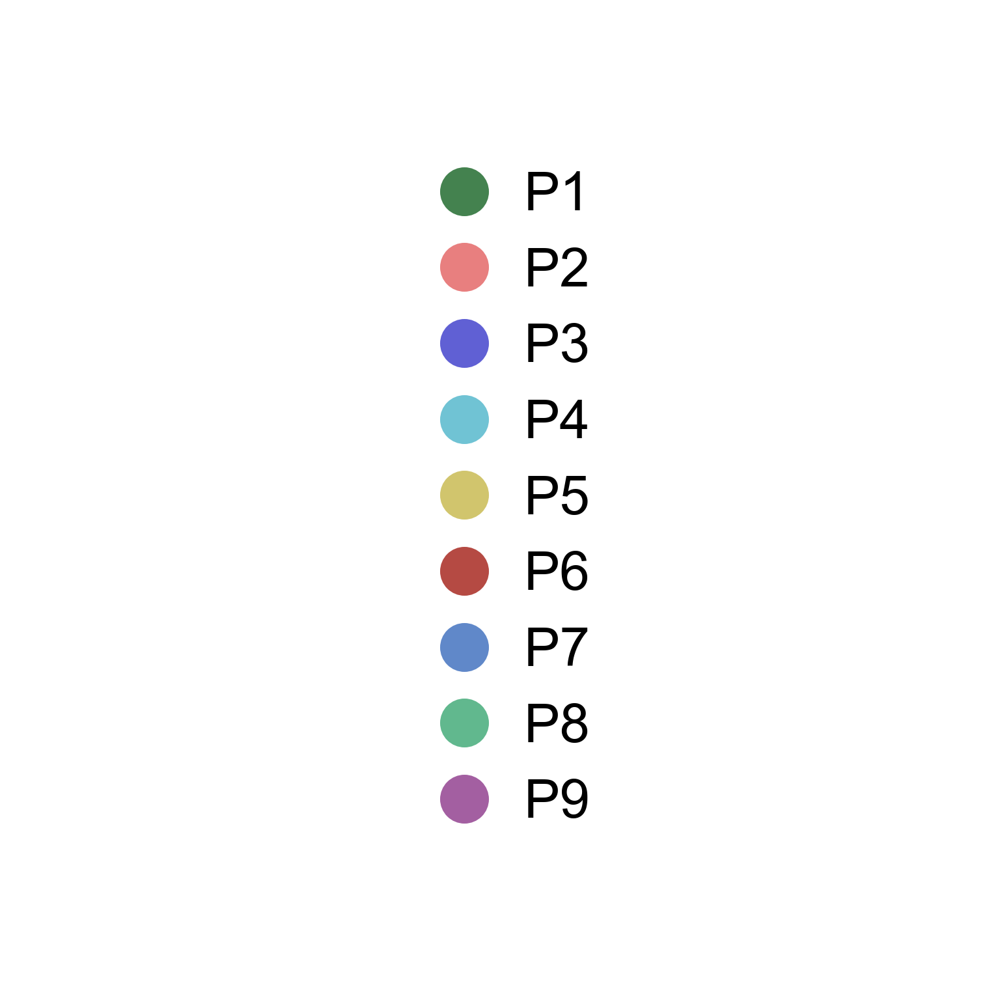

In [47]:
handles = []
for key, value in cdd['patient'].items():
    patch = plt.plot([], marker = 'o', ls = '', color=value, label=key, ms=5)[0]
    handles.append(patch)

fig, ax= plt.subplots(figsize=(4, 4), dpi=400, frameon=False)
ax.axis('off')
plt.legend(handles=handles, loc='center', frameon=False, markerscale=2.5,handletextpad=0.1, fontsize=15)

plt.tight_layout()
plt.savefig('figures_paper/patient_legend_umap.pdf', transparent=True)

## Figure 1d: cell type distribution in samples

In [27]:
adata.obs['cell_group'].unique()

['Myeloid cells', 'Tumor cells', 'Endothelium', 'Lymphoid cells', 'Stromal', 'Cycling', 'Epithelial']
Categories (7, object): ['Myeloid cells', 'Tumor cells', 'Endothelium', 'Lymphoid cells', 'Stromal', 'Cycling', 'Epithelial']

In [28]:
cdd.keys()

dict_keys(['age', 'beads', 'broad_cell_type', 'cell_type', 'closest_JZ_kidney', 'closest_JZ_kidney_hvg', 'doublet_score', 'library', 'library2', 'louvain_res_1.0', 'louvain_res_2.0', 'louvain_res_3.0', 'louvain_res_4.0', 'louvain_res_5.0', 'louvain_resolution_30.0', 'louvain_resolution_50.0', 'louvain_resolution_60.0', 'louvain_resolution_80.0', 'n_counts', 'necrosis', 'no_dblt_no_rbc', 'operation', 'pT stage', 'patient', 'pct_counts_mito', 'pheno_leiden', 'pheno_leiden_res_0.5', 'pheno_leiden_res_0.8', 'pheno_leiden_res_1.0', 'pheno_leiden_res_1.5', 'pheno_leiden_res_2.0', 'pheno_leiden_res_2.5', 'pheno_leiden_res_3.0', 'pheno_leiden_res_3.5', 'pheno_leiden_res_4.0', 'potential_doublet', 'removed_as_RBC', 'removed_as_dblt1', 'removed_as_dblt2', 'sample', 'seq_date', 'sex', 'sp_cl_38', 'sp_cl_39', 'sp_cl_40', 'sp_cl_42', 'sp_cl_43', 'sp_cl_45', 'sp_cl_47', 'sp_cl_50', 'tissue', 'top10pct_dbtl_score', 'top3pct_dbtl_score', 'top5pct_dbtl_score', 'total_counts', 'tumor size, mm'])

In [29]:
# adding some colors as they were not assigned before

group_color = {
    'Myeloid cells':'#85619c',
    'Tumor cells': '#db2f2c',
    'Endothelium': '#e07c57',
    'Lymphoid cells': '#4f9e58',
       'Stromal': '#d65a5a',
    'Cycling': '#5e5e5e', 
    'Epithelial': '#477ead'
}

adata.obs['group_color'] = [group_color[i] for i in adata.obs['cell_group']]

In [30]:
#adding this info to cdd because it was not there
cdd['cell_group'] = group_color

In [31]:
feature = 'cell_group'
condition = 'sample'


In [32]:
adata.obs['sample'].unique()

['T2', 'N3', 'N4', 'N2', 'T3', ..., 'T8', 'N9', 'T9', 'N1', 'T4']
Length: 17
Categories (17, object): ['T2', 'N3', 'N4', 'N2', ..., 'N9', 'T9', 'N1', 'T4']

In [33]:
category_colors = []
for i in adata.obs[feature].unique():
    category_colors.append(cdd[feature][i])

In [34]:

category_names = adata.obs[feature].unique()
category_names = list(category_names)
results = {}
for i in adata.obs[condition].unique():
    percentages = []
    results.update({i : percentages})
    for j in adata.obs[feature].unique():
        cmask = adata.obs[condition].isin([i]).values
        tmask = adata.obs[feature].isin([j]).values
        mask = cmask&tmask
        all_cells_in_sample = sum(cmask)
        percent = (sum(mask)*100)/all_cells_in_sample
        results.get(i).append(percent)
#for reassurance we can print the results
#print(results)

corder = ['N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'N7', 'N8', 'N9', 'T3', 'T5', 'T8','T2',  'T4', 'T6', 'T7', 'T9' ]
df = pd.DataFrame(results)
df = df[corder]
results = df.to_dict(orient = 'list')


In [48]:
def hbars(results, category_names):
    """
    Parameters
    ----------
    results : dict
        A mapping from question labels to a list of answers per category.
        It is assumed all lists contain the same number of entries and that
        it matches the length of *category_names*.
    category_names : list of str
        The category labels.
    """
    labels = list(results.keys())
    data = np.array(list(results.values()))
    data_cum = data.cumsum(axis=1)
    
   
    fig, ax = plt.subplots(figsize=(3, 3), dpi=400)
    
    ax.invert_yaxis()
    ax.xaxis.set_visible(False)
    ax.set_xlim(0, np.sum(data, axis=1).max())

    #removing the frame of the figure
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    
    for i, (colname, color) in enumerate(zip(category_names, category_colors)):
        widths = data[:, i]
        starts = data_cum[:, i] - widths
        ax.barh(labels, widths, left=starts, height=0.9,
                label=colname, color=color)
        xcenters = starts + widths / 2
    
    for tick in ax.yaxis.get_major_ticks():
        tick.label.set_fontsize(12)
    plt.tight_layout()
    plt.savefig('figures_paper/patient_cell_type_fraction.pdf', transparent=True)

    return fig, ax


(<Figure size 1200x1200 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f7d48723be0>)

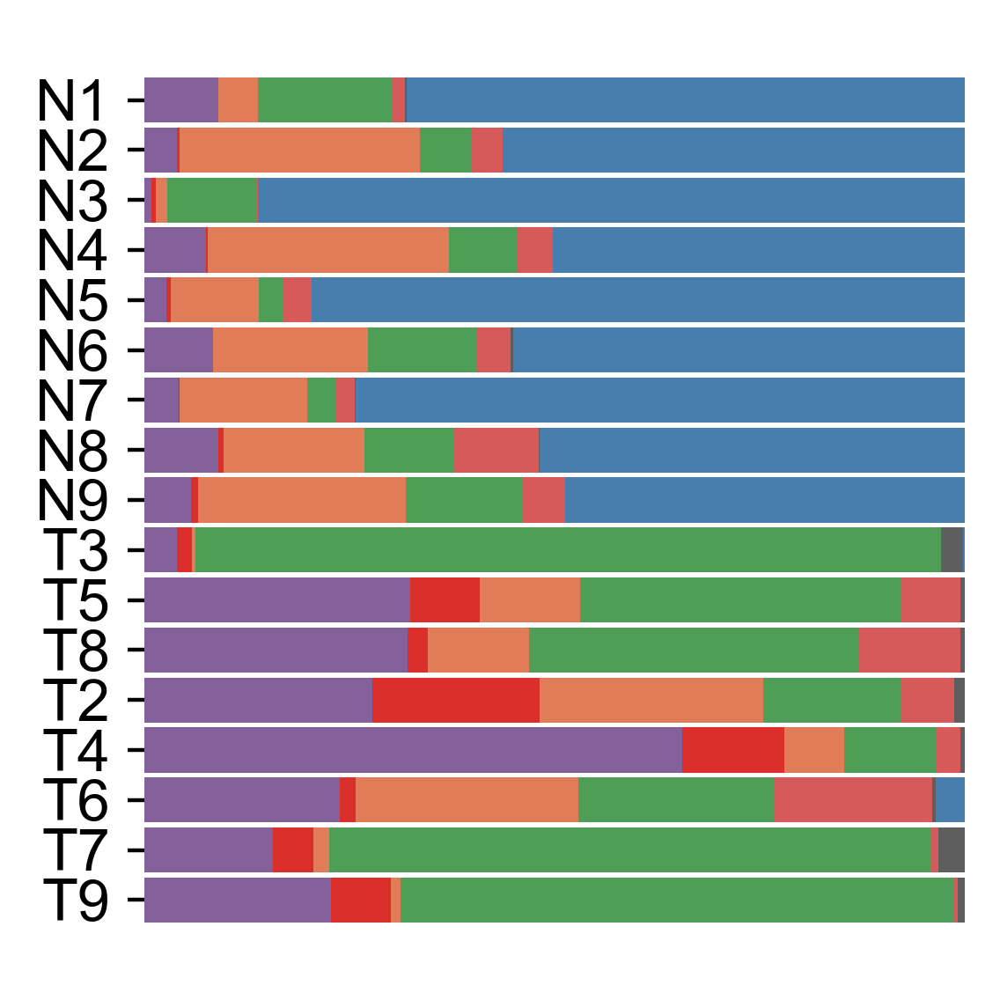

In [49]:

hbars(results, category_names)



In [83]:
tosave = pd.DataFrame(results, index = category_names)

In [84]:
fname = 'figures_paper/cell_type_proportions_in_samples.xlsx'
tosave.to_excel(fname)

<ipython-input-52-e54b680da06f>:10: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


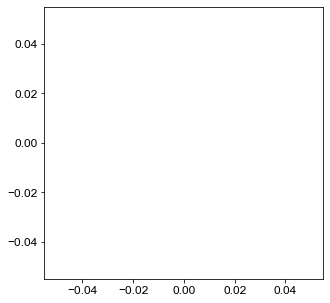

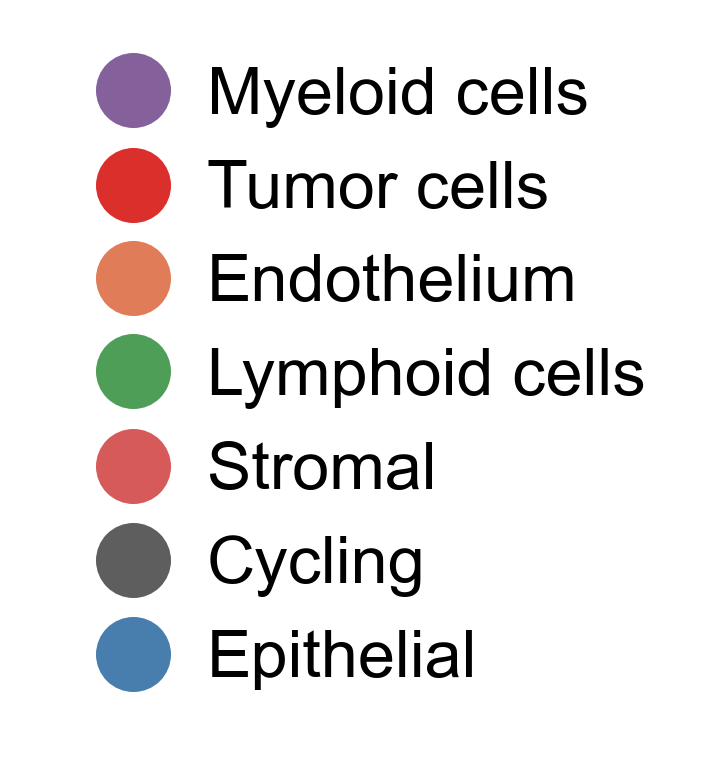

In [52]:
handles = []
for key, value in cdd['cell_group'].items():
    patch = plt.plot([], marker = 'o', ls = '', color=value, label=key, ms=5)[0]
    handles.append(patch)

fig, ax= plt.subplots(figsize=(1, 1), dpi=400, frameon=False)
ax.axis('off')
plt.legend(handles=handles, loc='center', frameon=False, markerscale=2.5,handletextpad=0.1, fontsize=12)

plt.tight_layout()
plt.savefig('figures_paper/patient_cell_group_legend.pdf', transparent=True)

## Figure 1e: epithelial progenitor-like cells



## Color one population only

In [69]:
ctype= 'Epithelial progenitor-like cells'
mask = adata.obs['cell_type'].isin([ctype])


In [70]:
adata[mask].obs['color'][0]

'#2d4173'

In [71]:
grey = '#D3D3D3'

grey_list = []
for i in adata.obs['cell_type']:
    if i==ctype:
        grey_list.append(adata[mask].obs['color'][0])
    else:
        grey_list.append(grey)
        


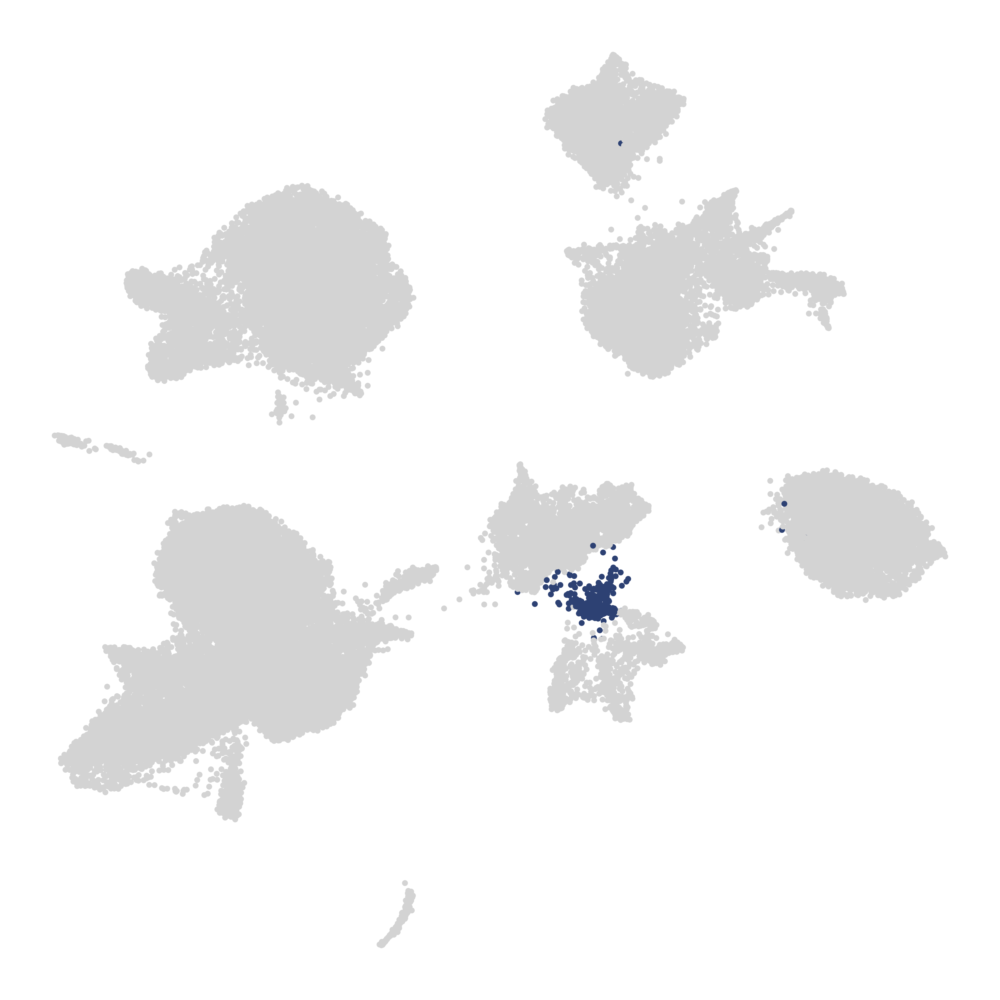

In [73]:
fig, ax = plt.subplots(figsize=(10, 10), frameon=False, dpi=400)
ax1 = plt.scatter(adata.obsm['X_umap'][:, 0], adata.obsm['X_umap'][:, 1], color=grey_list,
            s=10) 
ax.axis('off')


#!mkdir figures_paper
plt.tight_layout()
plt.savefig('figures_paper/epi_prog_umap_hq.png', transparent=True)

In [21]:
adata.X.sum(axis=1)

matrix([[ 449.],
        [ 449.],
        [1229.],
        ...,
        [ 498.],
        [ 421.],
        [ 763.]], dtype=float32)

In [54]:
sc.pp.normalize_per_cell(adata,counts_per_cell_after=1e4)

In [55]:
adata.X.sum(axis=1)

matrix([[10000.001],
        [10000.   ],
        [10000.001],
        ...,
        [ 9999.999],
        [ 9999.999],
        [ 9999.999]], dtype=float32)

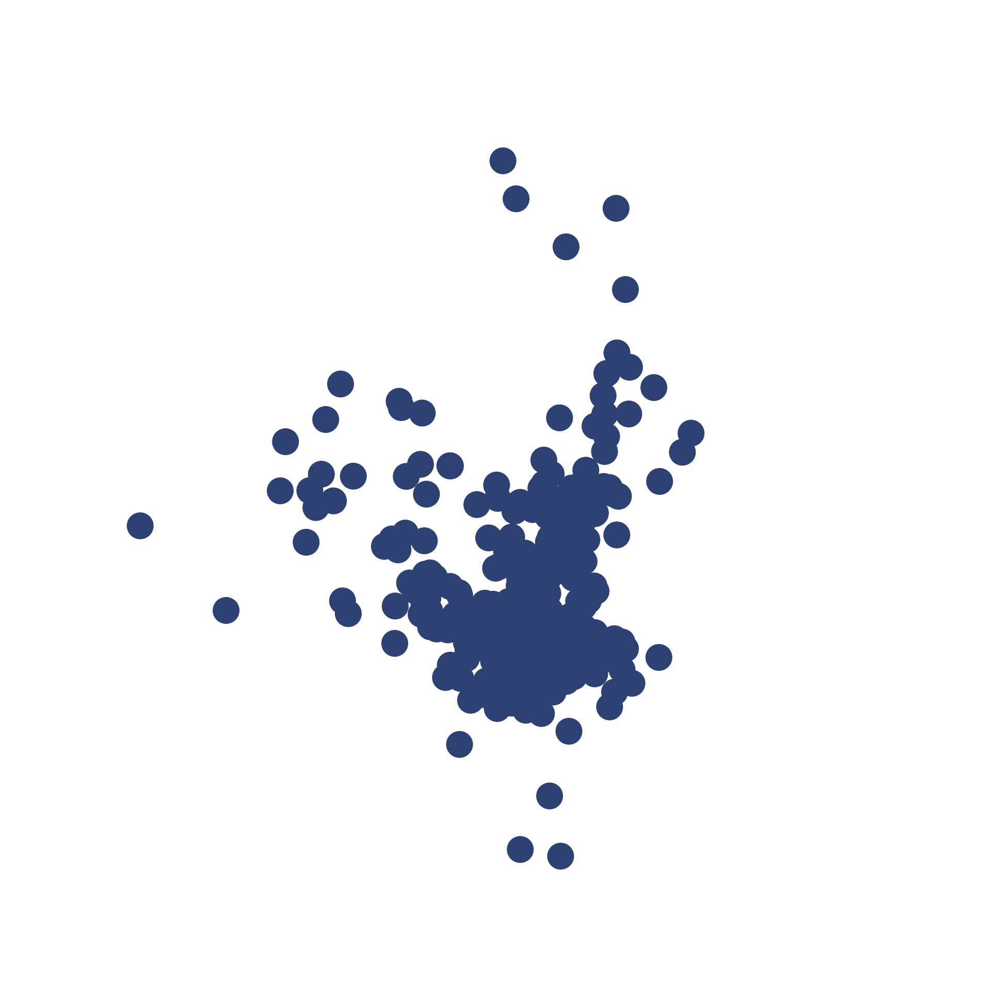

In [32]:
fig, ax = plt.subplots(figsize=(5, 5), frameon=False, dpi=400)
ax1 = plt.scatter(adata[mask].obsm['X_umap'][:, 0], adata[mask].obsm['X_umap'][:, 1], color=adata[mask].obs['color'],
            s=70) 
ax.set_xlim([5, 10])
ax.set_ylim([4, 8])
ax.axis('off')

#!mkdir figures_paper
plt.tight_layout()
plt.savefig('figures_paper/epithelial_prog.png', transparent=True)

In [74]:
genes = ['PROM1', 'ITGB8', 'VCAM1', 'SLC17A3', 'CD24']

In [75]:
#choosing the colormap
from matplotlib.colors import LinearSegmentedColormap
cmap = LinearSegmentedColormap.from_list(
    name='cmap', 
    colors=['#D3D3D3', #grey
            #'#ff8080', 
            '#cc0000' #dark-red
           ])

<ipython-input-88-e97dff0e5d2e>:33: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


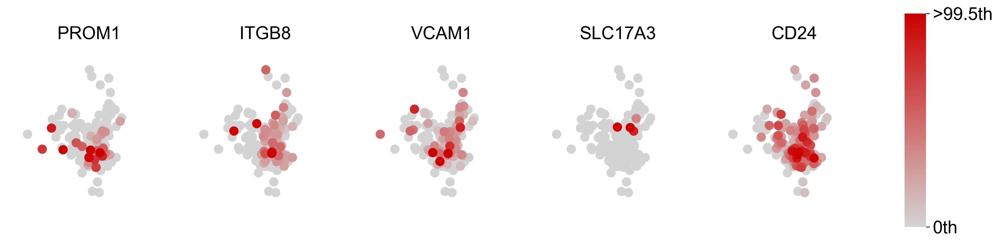

In [88]:
fig = plt.figure(figsize = (15,3), dpi=300)
pctilemax = 99.5

#cmap=sns.color_palette("magma", as_cmap=True)
for i, gene in enumerate(genes):
    gmask = adata.var_names == gene
    color = adata[mask].X[:,gmask].toarray().T[0]
    vmax = np.percentile(color,pctilemax)

    order = np.argsort(color)

    color = color[order]
    x = adata[mask].obsm['X_umap'][:, 0][order]
    y = adata[mask].obsm['X_umap'][:, 1][order]

    
    a = fig.add_subplot(1,6, 1+i, frameon = False)
    b = a.scatter(x, y, c = color, vmax =vmax, s=70, cmap=cmap)
    plt.xticks([])
    plt.yticks([])
    plt.title(str(gene), size = 18)

    plt.tight_layout()
    a.set_xlim([5, 10])
    a.set_ylim([4, 8])
    ax.axis('off')
    
caxb = fig.add_axes([0.85, 0, 0.02, 1])
cbar = plt.colorbar(b,orientation='vertical', cax=caxb, cmap=cmap)
cbar.outline.set_visible(False)
cbar.set_ticks([0,vmax])
cbar.ax.set_yticklabels(['0th','>%0.1fth'%pctilemax], size=18) 
plt.tight_layout()
plt.savefig('figures_paper/epithelial_progenitor_like_genes_hq.pdf', transparent=True, bbox_inches='tight')


## Figure 2a: myeloid populations highlighted

In [16]:

ctypes=[ 'Classical monocytes', 'Non-classical monocytes','TAM 1', 'TAM 2', 'TAM 3', 'TAM 4']

grey = '#D3D3D3'


masks = {}
for ctype in ctypes:
    mask = adata.obs['cell_type'].isin([ctype])
    masks[ctype] = mask
    
color_list = []
for i in adata.obs['cell_type']:
    if i in ctypes:
        mask = masks[i]
        color_list.append(adata[mask].obs['color'][0])
    else:
        color_list.append(grey)


In [17]:
set(color_list)

{'#532b6b', '#84619c', '#943886', '#9846a8', '#9a5ce0', '#D3D3D3', '#d658f5'}

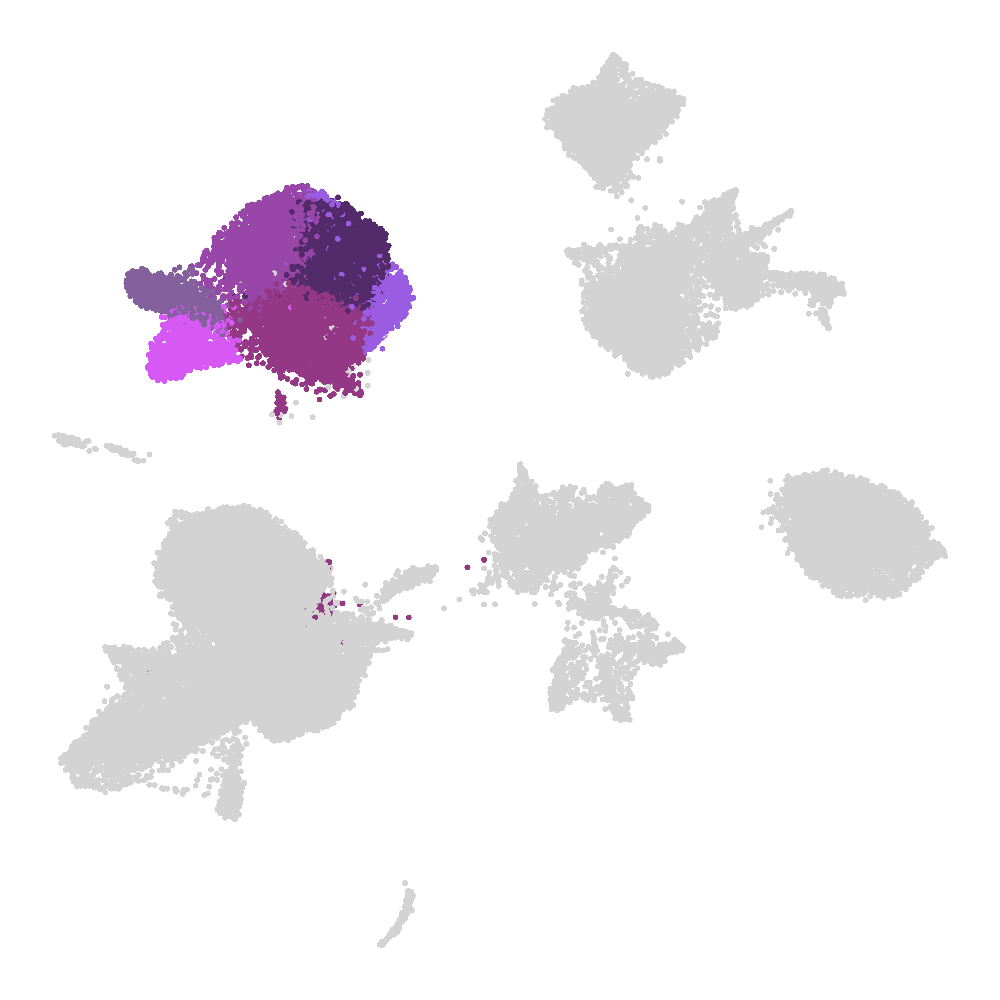

In [18]:
fig, ax = plt.subplots(figsize=(10, 10), frameon=False, dpi=400)
ax1 = plt.scatter(adata.obsm['X_umap'][:, 0], adata.obsm['X_umap'][:, 1], color=color_list,
            s=10) 
ax.axis('off')


#!mkdir figures_paper
plt.tight_layout()
plt.savefig('figures_paper/tams_colored_umap_hq.png', transparent=True)

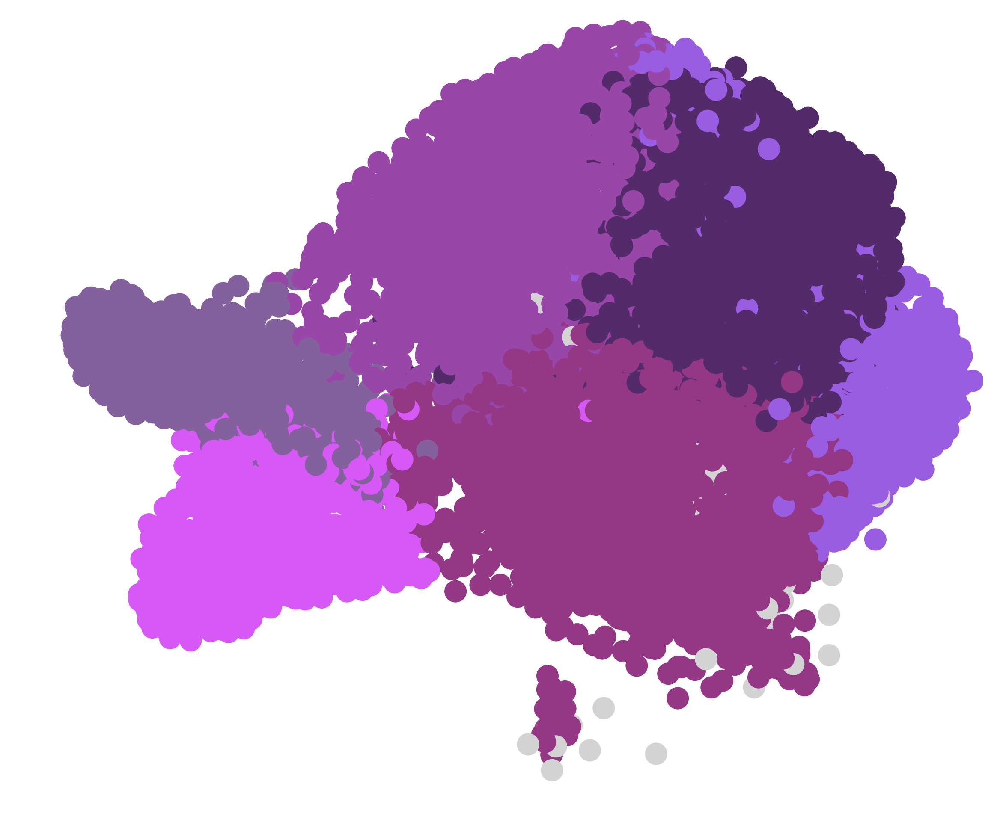

In [19]:
fig, ax = plt.subplots(figsize=(6, 5), frameon=False, dpi=400)
ax1 = plt.scatter(adata.obsm['X_umap'][:, 0], adata.obsm['X_umap'][:, 1], color=color_list,
            s=70) 
ax.set_xlim([-5, 3])
ax.set_ylim([10.5, 18])
ax.axis('off')
#!mkdir figures_paper
plt.tight_layout()
plt.savefig('figures_paper/tams_colored_only_umap_hq.png', transparent=True)

In [71]:
ctypes=[ 'Classical monocytes', 'Non-classical monocytes','TAM 1', 'TAM 2', 'TAM 3', 'TAM 4']

grey = '#D3D3D3'


In [72]:
markers = { 'Monocyte' : ['CD14', 'FCGR3A'],
    'Immunossupressive': ['MARCO', 'APOE', 'APOC1', 'VSIG4', 'VSIR'], 
           'Inflammatory' : ['CXCL8', 'TNF', 'IL1B', 'CCL3', 'FCGR1A'],
          'Complement system': ['C1QA', 'C1QB', 'C1QC'],
          'MHC complex genes': ['HLA-DPB1', 'HLA-DPA1', 'HLA-DRA']}

In [73]:
cmask = adata.obs['cell_type'].isin(ctypes).values

In [74]:
genes = []
for i in markers.values():
    for j in i:
        genes.append(j)

In [75]:
gmask = adata.var_names.isin(genes)

In [76]:
#choosing the colormap
from matplotlib.colors import LinearSegmentedColormap
cmap = LinearSegmentedColormap.from_list(
    name='cmap', 
    colors=['#D3D3D3', #grey
            #'#ff8080', 
            '#cc0000' #dark-red
           ])

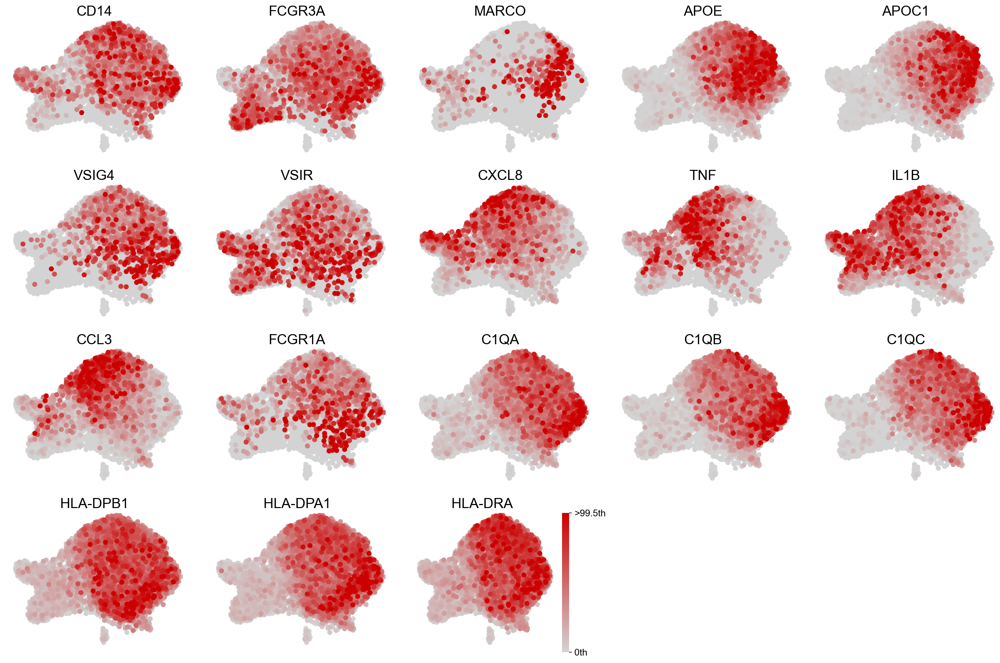

In [77]:
fig = plt.figure(figsize = (18,12), dpi=150)
pctilemax = 99.5

#cmap=sns.color_palette("magma", as_cmap=True)
for i, gene in enumerate(genes):
    gmask = adata.var_names == gene
    color = adata[cmask].X[:,gmask].toarray().T[0]
    vmax = np.percentile(color,pctilemax)

    order = np.argsort(color)

    color = color[order]
    x = adata[cmask].obsm['X_umap'][:, 0][order]
    y = adata[cmask].obsm['X_umap'][:, 1][order]

    
    a = fig.add_subplot(4,5, 1+i, frameon = False)
    b = a.scatter(x, y, c = color, vmax =vmax, s=30, cmap=cmap)
    plt.xticks([])
    plt.yticks([])
    plt.title(str(gene), size = 18)

    plt.tight_layout()
    a.set_xlim([-5, 3])
    a.set_ylim([10.5, 18])
    ax.axis('off')
    

cbar = plt.colorbar(b,orientation='vertical', cmap=cmap)
cbar.outline.set_visible(False)
cbar.set_ticks([0,vmax])
cbar.ax.set_yticklabels(['0th','>%0.1fth'%pctilemax]) 
plt.tight_layout()

#plt.savefig('figures_paper/macrophage_polar_genes_lq.png', transparent=True)


In [78]:
thelabel = 'cell_type'
centroids = rz.centroids(thelabel,adata[cmask])

In [79]:
outdir = 'figures_paper/'
label = 'macrophage_genes'

In [80]:
columns = ['TAM 4', 'TAM 3', 'TAM 2', 'TAM 1', 'Non-classical monocytes', 'Classical monocytes']

In [81]:
#percentage max expression

heat = centroids[genes]
heat = heat.loc[:,heat.max() > 0]
heat = heat/heat.max()*100.
heat = heat.T

#choosing the colormap
from matplotlib.colors import LinearSegmentedColormap
cmap = LinearSegmentedColormap.from_list(
    name='cmap', 
    colors=['#D3D3D3', #grey
            #'#ff8080', 
            '#cc0000' #dark-red
           ])

In [82]:
heat = heat[columns]

0.7010369 100.0
heatmap_pctmax_mono_macrophage_genes


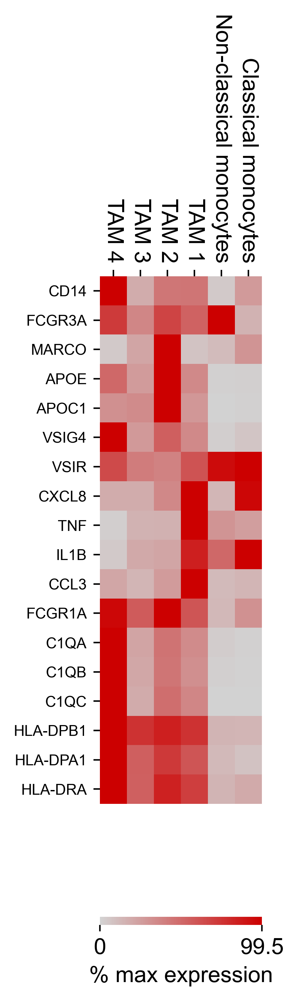

In [86]:

a,fig,gs = rz.startfig(6,20,frameon=False, mydpi=400)

cmap = cmap
cbarlabel = '% max expression'

vmin=0
vmax=99.5

print(heat.min().min(),heat.max().max())

# heatmap
hmap = a.imshow(heat,aspect='auto',vmin=vmin,vmax=vmax,cmap=cmap)

# x ticks
a.set_xticks(np.arange(heat.shape[1]))
a.set_xticklabels(heat.columns,rotation=270, fontsize=12)
a.xaxis.tick_top()

# y ticks:
a.set_yticks(np.arange(heat.shape[0]))
a.set_yticklabels(heat.index, fontsize=8)

# colorbar
cbar = fig.colorbar(hmap,orientation='horizontal')
cbar.outline.set_visible(False)

c = [vmin,vmax]
cbar.set_ticks(c)
cbar.set_ticklabels(c)
cbar.set_label(cbarlabel)


gs.tight_layout(fig)
fname = 'heatmap_pctmax_mono_%s'%(label)
print(fname)
#plt.savefig(outdir+'%s.png'%fname)
plt.savefig(outdir+'%s.pdf'%fname)

## Figure 2b: lymphoid populations highlighted

In [88]:

ctypes=[ 'CD8 T cells', 'Regulatory T cells', 'Resting/memory T cells','Cytotoxic T cells', 'NK cells']

grey = '#D3D3D3'


masks = {}
for ctype in ctypes:
    mask = adata.obs['cell_type'].isin([ctype])
    masks[ctype] = mask
    
color_list = []
for i in adata.obs['cell_type']:
    if i in ctypes:
        mask = masks[i]
        color_list.append(adata[mask].obs['color'][0])
    else:
        color_list.append(grey)

In [89]:
cmask = adata.obs['cell_type'].isin(ctypes).values

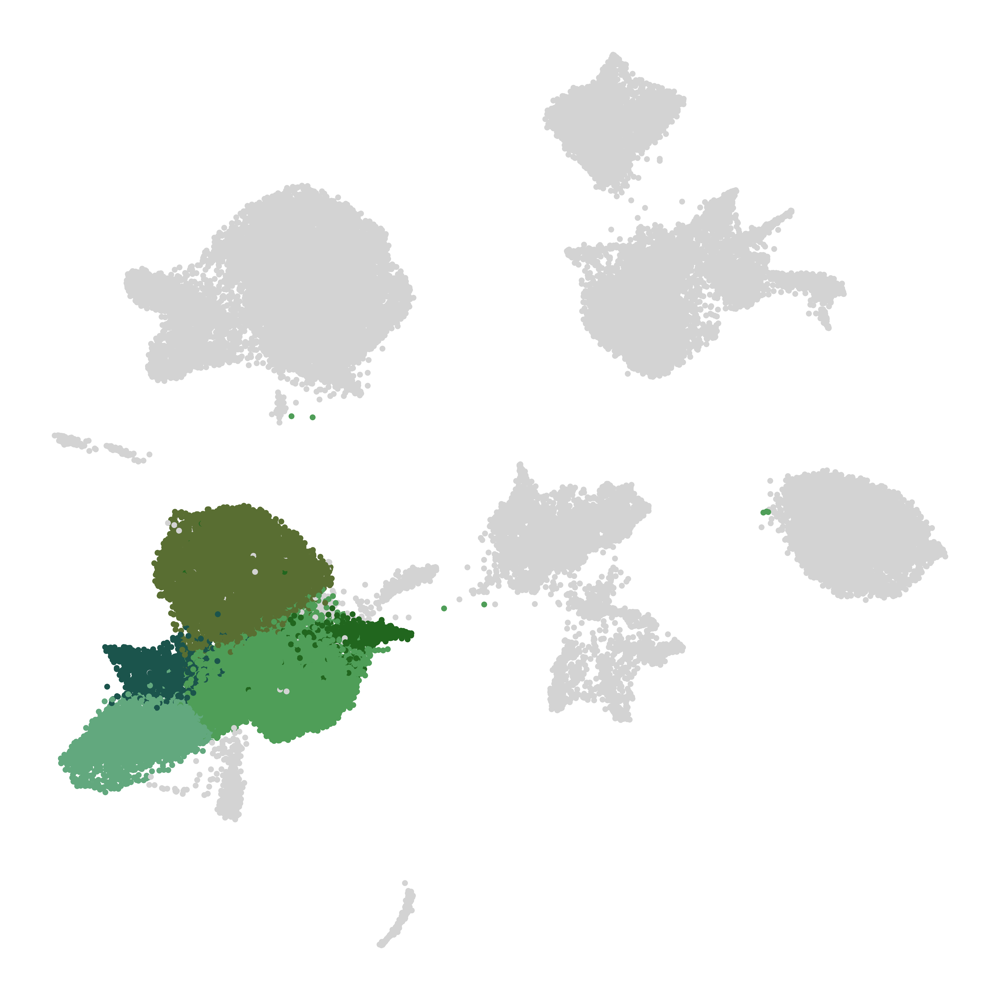

In [90]:
fig, ax = plt.subplots(figsize=(10, 10), frameon=False, dpi=400)
ax1 = plt.scatter(adata.obsm['X_umap'][:, 0], adata.obsm['X_umap'][:, 1], color=color_list,
            s=10) 
ax.axis('off')


#!mkdir figures_paper
plt.tight_layout()
#plt.savefig('figures_paper/lymphoid_colored_umap_hq.png', transparent=True)

In [76]:
color_list2 = np.array(color_list)

In [77]:
len(color_list2[cmask])

19210

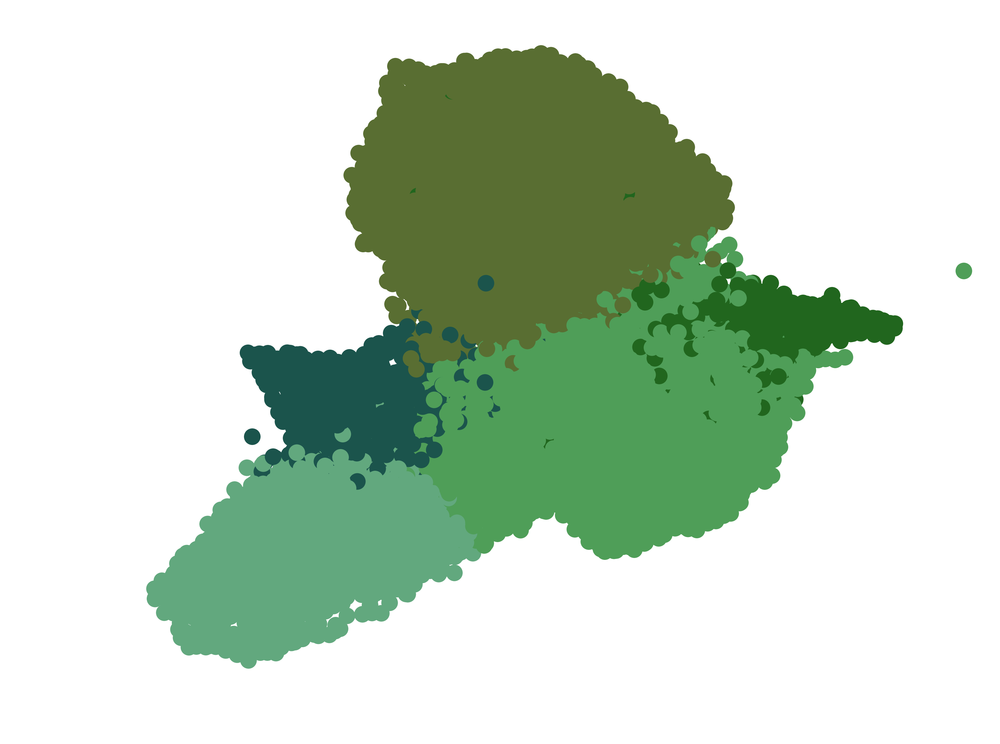

In [140]:
fig, ax = plt.subplots(figsize=(8, 6), frameon=False, dpi=400)
ax1 = plt.scatter(adata[cmask].obsm['X_umap'][:, 0], adata[cmask].obsm['X_umap'][:, 1], color=np.array(color_list)[cmask],
            s=70) 
ax.set_xlim([-8, 4])
ax.set_ylim([-1, 9])
ax.axis('off')
#!mkdir figures_paper
plt.tight_layout()
plt.savefig('figures_paper/lymphoid_colored_only_umap_hq.png', transparent=True)

In [51]:
ctypes=[ 'CD8 T cells', 'Regulatory T cells', 'Resting/memory T cells','Cytotoxic T cells', 'NK cells']

grey = '#D3D3D3'


In [52]:
cmask = adata.obs['cell_type'].isin(ctypes).values

In [54]:
cmask.sum()

19210

### Color by expression of exhaustion genes

In [93]:
#exhaustion genes

genes = ['LAG3', 'PDCD1', 'HAVCR2', 'CTLA4', 'TIGIT','TNFRSF4', 'ENTPD1', 'TOX', 'CD160', 'EOMES', 'CD38',
         'IL2RA', 'CD69', 'ICOS', 'TNFRSF9', 'CD28', 'CD27', 'PTPN6']

In [94]:
adata.X.sum(axis=1) #normalized

matrix([[10000.001],
        [10000.   ],
        [10000.001],
        ...,
        [ 9999.999],
        [ 9999.999],
        [ 9999.999]], dtype=float32)

In [96]:
thelabel = 'cell_type'
centroids = rz.centroids(thelabel,adata[cmask] )#[cmask])

In [97]:

heat = centroids[genes]
heat = heat.loc[:,heat.max() > 0]
heat = heat/heat.max()*100.
heat = heat.T

#choosing the colormap
from matplotlib.colors import LinearSegmentedColormap
cmap = LinearSegmentedColormap.from_list(
    name='cmap', 
    colors=['#D3D3D3', #grey
            #'#ff8080', 
            '#cc0000' #dark-red
           ])

In [98]:
columns = ctypes

In [99]:
heat = heat[columns]

In [100]:
label = 'exhaustion_genes'

In [101]:
outdir = 'figures_paper/'

0.2533492 100.0
heatmap_pctmax995_lymphoid_exhaustion_genes


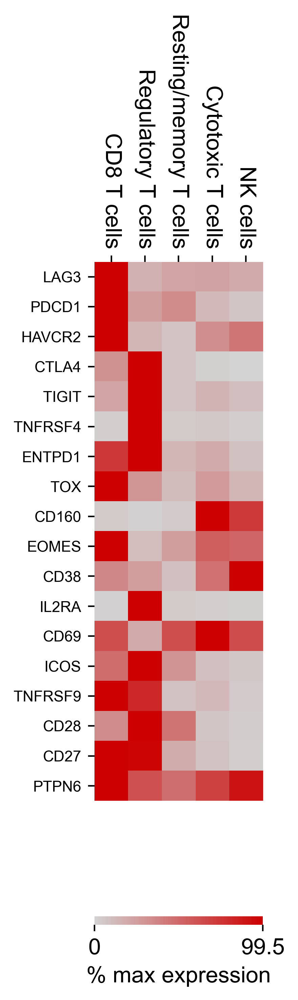

In [103]:

a,fig,gs = rz.startfig(6,20,frameon=False, mydpi=400)

cmap = cmap
cbarlabel = '% max expression'

vmin=0
vmax=99.5

print(heat.min().min(),heat.max().max())

# heatmap
hmap = a.imshow(heat,aspect='auto',vmin=vmin,vmax=vmax,cmap=cmap)

# x ticks
a.set_xticks(np.arange(heat.shape[1]))
a.set_xticklabels(heat.columns,rotation=270, fontsize=12)
a.xaxis.tick_top()

# y ticks:
a.set_yticks(np.arange(heat.shape[0]))
a.set_yticklabels(heat.index, fontsize=8)

# colorbar
cbar = fig.colorbar(hmap,orientation='horizontal')
cbar.outline.set_visible(False)

c = [vmin,vmax]
cbar.set_ticks(c)
cbar.set_ticklabels(c)
cbar.set_label(cbarlabel)


gs.tight_layout(fig)
fname = 'heatmap_pctmax995_lymphoid_%s'%(label)
print(fname)
#plt.savefig(outdir+'%s.png'%fname)
plt.savefig(outdir+'%s.pdf'%fname)

## Figure 5a: stromal cell populations highlighted


In [88]:
adata.obs['cell_type'].unique()

array(['TAM 4', 'TAM 3', 'Tumor cells 2', 'Tumor cells 3',
       'Tumor vasculature 4', 'TAM 1', 'CD8 T cells', 'TAM 2',
       'Resting/memory T cells', 'Cytotoxic T cells',
       'Tumor vasculature 2', 'Tumor vasculature 1',
       'Non-classical monocytes', 'Mesangial/vSMCs',
       'IGHG-high plasma cells', 'Mast cells', 'Tumor vasculature 3',
       'Plasma cells', 'Tumor AVR-like vasculature', 'Cycling', 'vSMCs',
       'NK cells', 'Classical monocytes', 'B cells', 'Myofibroblasts',
       'Regulatory T cells', 'Tumor cells 1', 'Proximal tubule', 'AVR',
       'Epithelial progenitor-like cells', 'tAL of LOH',
       'Glomerular endothelium', 'Principal cells', 'TAL of LOH', 'DVR',
       'Type A-ICs', 'OM Type A-ICs', 'Type B-IC', 'Podocytes', 'DCT/CNT'],
      dtype=object)

In [56]:

ctypes=['Mesangial/vSMCs', 'vSMCs', 'Myofibroblasts']

grey = '#D3D3D3'


masks = {}
for ctype in ctypes:
    mask = adata.obs['cell_type'].isin([ctype])
    masks[ctype] = mask
    
color_list = []
for i in adata.obs['cell_type']:
    if i in ctypes:
        mask = masks[i]
        color_list.append(adata[mask].obs['color'][0])
    else:
        color_list.append(grey)

In [57]:
cmask = adata.obs['cell_type'].isin(ctypes).values

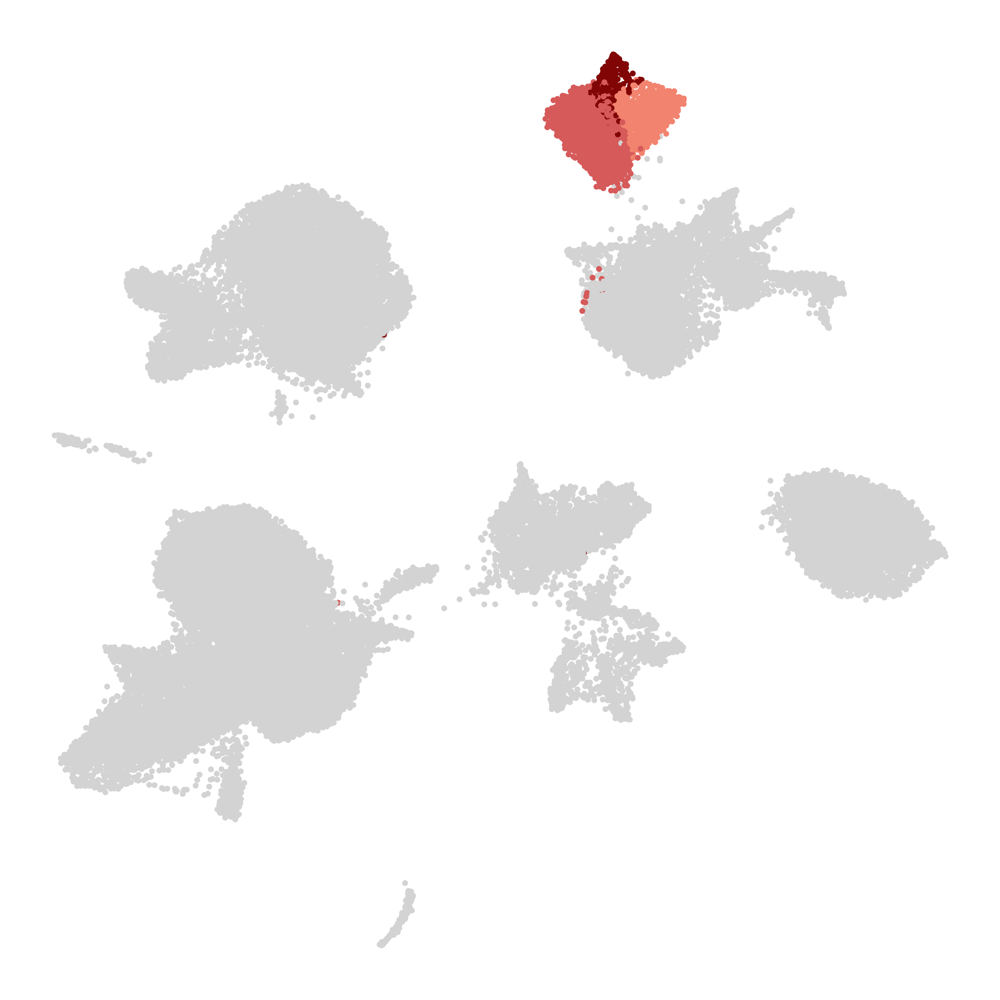

In [58]:
fig, ax = plt.subplots(figsize=(10, 10), frameon=False, dpi=400)
ax1 = plt.scatter(adata.obsm['X_umap'][:, 0], adata.obsm['X_umap'][:, 1], color=color_list,
            s=10) 
ax.axis('off')


#!mkdir figures_paper
plt.tight_layout()
plt.savefig('figures_paper/stromal_colored_umap_hq.png', transparent=True)

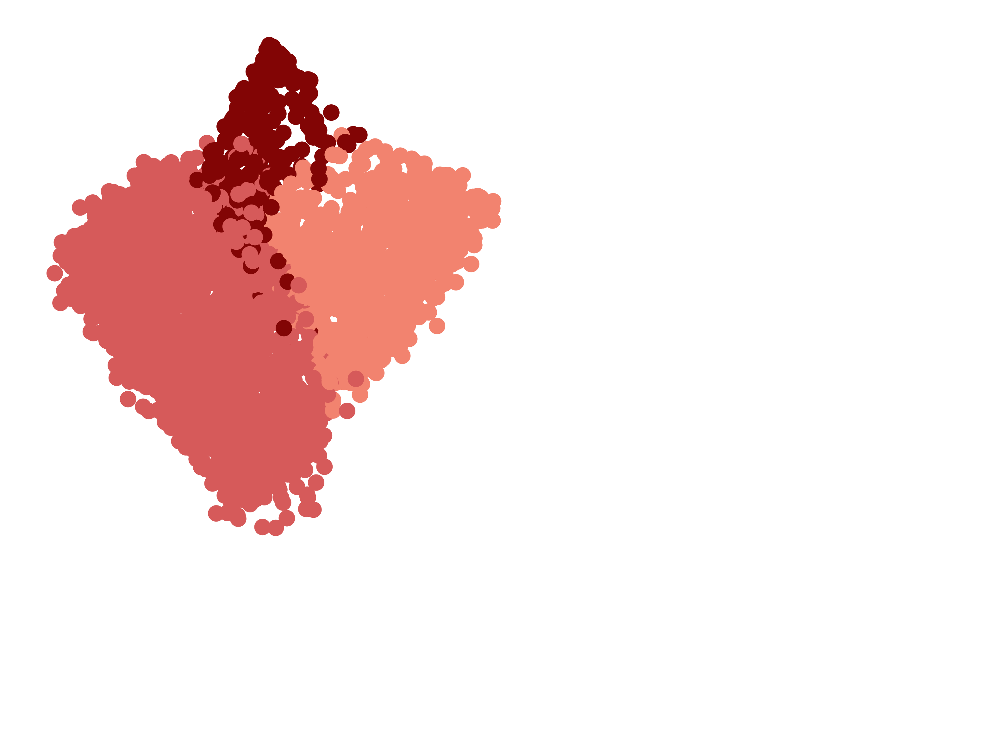

In [59]:
fig, ax = plt.subplots(figsize=(8, 6), frameon=False, dpi=400)
ax1 = plt.scatter(adata[cmask].obsm['X_umap'][:, 0], adata[cmask].obsm['X_umap'][:, 1], color=np.array(color_list)[cmask],
            s=70) 
ax.set_xlim([6, 14])
ax.set_ylim([16, 22])
ax.axis('off')
#!mkdir figures_paper
plt.tight_layout()
plt.savefig('figures_paper/stromal_colored_only_umap_hq.png', transparent=True)

## turns out two labels were mixed - fixing that mixup
Note - that does not change anything in prior analysis


In [291]:
renamer = {"0621Normal":"N3_old",
"0621Tumor":"T3_old",
"0704Normal":"N1_old",
           
"0818T_S1":"T5_1",
"0903T_2_S3":"T6_1",
"0903T_S2":"T6_2",
"0914T_2_S5":"T7_2",
"0914T_S4":"T7_1",
"0923T_2_S7":"T8_2",
"0923T_S6":"T8_1",
"1116N_S11":"N9_1",
"1116T1_S8":"T9_1",
"1116T2_S9":"T9_2",
"1116T3_1_S10":"T9_3",
           
"Healthy0228":"N4_old",
"Healthy0314":"T2_old", #names were accidentally swapped between tumor and normal while running StarSolo
           
"N093_S4":"N6_1",
"N14":"T2_1", #names were accidentally swapped between tumor and normal while running StarSolo
"N21":"N3_1",
"N28":"N4_1",
           
"N818_S2":"N5_1",
"N914_S6":"N7_1",
"N923_S8":"N8_1",
           
"T04":"T1_1",
"T14":"N2_1",#names were accidentally swapped between tumor and normal while running StarSolo
"T21":"T3_1",
"T28":"T4_1",
           
"T818_S1":"T5_2",
"T903_S3":"T6_3",
"T914_S5":"T7_3",
"T923_S7":"T8_3",
           
"Tumor0228":"T4_old",
"Tumor0314":"N2_old" #names were accidentally swapped between tumor and normal while running StarSolo
}

In [292]:
adata.obs['library2'] = [renamer[i] for i in adata.obs['library']]
adata.obs.head()

,library,total_counts,pct_counts_mito,library2,sample,patient,pT stage,seq_date,beads,operation,...,n_counts,no_dblt_no_rbc,sp_cl_43,cell_type,broad_cell_type,color,cell_group,stage_color,patient_color,group_color
2,N14,449,0.668151,T2_1,T2,P2,pT3a,20_11_12,old,Open,...,449.0,True,40,TAM 4,Immune,#9a5ce0,Myeloid cells,#8c1a1a,#e87f7f,#85619c
19,N14,449,4.23163,T2_1,T2,P2,pT3a,20_11_12,old,Open,...,449.0,True,37,TAM 3,Immune,#943886,Myeloid cells,#8c1a1a,#e87f7f,#85619c
363,N14,1229,10.6591,T2_1,T2,P2,pT3a,20_11_12,old,Open,...,1229.0,True,22,Tumor cells 2,Tumor,#b06c6c,Tumor cells,#8c1a1a,#e87f7f,#db2f2c
433,N14,432,6.94444,T2_1,T2,P2,pT3a,20_11_12,old,Open,...,432.0,True,27,Tumor cells 3,Tumor,#db2f2c,Tumor cells,#8c1a1a,#e87f7f,#db2f2c
444,N14,502,4.98008,T2_1,T2,P2,pT3a,20_11_12,old,Open,...,502.0,True,28,Tumor vasculature 4,Endothelial,#a35927,Endothelium,#8c1a1a,#e87f7f,#e07c57


In [293]:
adata.obs['library2'].unique()

array(['T2_1', 'N3_1', 'N4_1', 'N2_1', 'T3_1', 'N6_1', 'N5_1', 'N7_1',
       'N8_1', 'T5_2', 'T6_3', 'T7_3', 'T8_3', 'T5_1', 'T6_1', 'T6_2',
       'T7_2', 'T7_1', 'T8_2', 'T8_1', 'N9_1', 'T9_1', 'T9_2', 'T9_3',
       'N1_old', 'T2_old', 'N3_old', 'N4_old', 'N2_old', 'T3_old',
       'T4_old'], dtype=object)

In [296]:
mask = adata.obs['library2'].isin(['T2_old'])

In [299]:
renamer = {
"N1_old":"N1",
"N2_1":"N2",
"N2_old":"N2",
"N3_1":"N3",
"N3_old":"N3",
"N4_1":"N4",
"N4_old":"N4",
"N5_1":"N5",
"N6_1":"N6",
"N7_1":"N7",
"N8_1":"N8",
"N9_1":"N9",
"T2_1":"T2",
"T2_old":"T2",
"T3_1":"T3",
"T3_old":"T3",
"T4_old":"T4",
"T5_1":"T5",
"T5_2":"T5",
"T6_1":"T6",
"T6_2":"T6",
"T6_3":"T6",
"T7_1":"T7",
"T7_2":"T7",
"T7_3":"T7",
"T8_1":"T8",
"T8_2":"T8",
"T8_3":"T8",
"T9_1":"T9",
"T9_2":"T9",
"T9_3":"T9"
}
adata.obs['sample'] = [renamer[i] for i in adata.obs['library2']]
adata.obs.head()

,library,total_counts,pct_counts_mito,library2,sample,patient,pT stage,seq_date,beads,operation,...,n_counts,no_dblt_no_rbc,sp_cl_43,cell_type,broad_cell_type,color,cell_group,stage_color,patient_color,group_color
2,N14,449,0.668151,T2_1,T2,P2,pT3a,20_11_12,old,Open,...,449.0,True,40,TAM 4,Immune,#9a5ce0,Myeloid cells,#8c1a1a,#e87f7f,#85619c
19,N14,449,4.23163,T2_1,T2,P2,pT3a,20_11_12,old,Open,...,449.0,True,37,TAM 3,Immune,#943886,Myeloid cells,#8c1a1a,#e87f7f,#85619c
363,N14,1229,10.6591,T2_1,T2,P2,pT3a,20_11_12,old,Open,...,1229.0,True,22,Tumor cells 2,Tumor,#b06c6c,Tumor cells,#8c1a1a,#e87f7f,#db2f2c
433,N14,432,6.94444,T2_1,T2,P2,pT3a,20_11_12,old,Open,...,432.0,True,27,Tumor cells 3,Tumor,#db2f2c,Tumor cells,#8c1a1a,#e87f7f,#db2f2c
444,N14,502,4.98008,T2_1,T2,P2,pT3a,20_11_12,old,Open,...,502.0,True,28,Tumor vasculature 4,Endothelial,#a35927,Endothelium,#8c1a1a,#e87f7f,#e07c57


In [300]:
adata[mask].obs

,library,total_counts,pct_counts_mito,library2,sample,patient,pT stage,seq_date,beads,operation,...,n_counts,no_dblt_no_rbc,sp_cl_43,cell_type,broad_cell_type,color,cell_group,stage_color,patient_color,group_color
3981777,Healthy0314,484,4.54545,T2_old,T2,P2,H_pT3a,old,old,Open,...,484.0,True,28,Tumor vasculature 4,Endothelial,#a35927,Endothelium,#477ead,#e87f7f,#e07c57
3981826,Healthy0314,927,2.48112,T2_old,T2,P2,H_pT3a,old,old,Open,...,927.0,True,12,Mast cells,Immune,#c744a8,Myeloid cells,#477ead,#e87f7f,#85619c
3982011,Healthy0314,626,3.51438,T2_old,T2,P2,H_pT3a,old,old,Open,...,626.0,True,18,Tumor vasculature 3,Endothelial,#8a0303,Endothelium,#477ead,#e87f7f,#e07c57
3982094,Healthy0314,470,2.12766,T2_old,T2,P2,H_pT3a,old,old,Open,...,470.0,True,31,CD8 T cells,Immune,#596e32,Lymphoid cells,#477ead,#e87f7f,#4f9e58
3982159,Healthy0314,592,1.85811,T2_old,T2,P2,H_pT3a,old,old,Open,...,592.0,True,33,B cells,Immune,#44ab89,Lymphoid cells,#477ead,#e87f7f,#4f9e58
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4127924,Healthy0314,401,4.2394,T2_old,T2,P2,H_pT3a,old,old,Open,...,401.0,True,28,Tumor vasculature 4,Endothelial,#a35927,Endothelium,#477ead,#e87f7f,#e07c57
4128134,Healthy0314,700,1.85714,T2_old,T2,P2,H_pT3a,old,old,Open,...,700.0,True,24,Tumor AVR-like vasculature,Endothelial,#73472a,Endothelium,#477ead,#e87f7f,#e07c57
4128302,Healthy0314,1208,3.5596,T2_old,T2,P2,H_pT3a,old,old,Open,...,1208.0,True,30,TAM 2,Immune,#532b6b,Myeloid cells,#477ead,#e87f7f,#85619c
4128326,Healthy0314,620,3.22581,T2_old,T2,P2,H_pT3a,old,old,Open,...,620.0,True,4,TAM 1,Immune,#9846a8,Myeloid cells,#477ead,#e87f7f,#85619c


In [301]:
renamer = {
"N1":"P1",
"N2":"P2",
"N3":"P3",
"N4":"P4",
"N5":"P5",
"N6":"P6",
"N7":"P7",
"N8":"P8",
"N9":"P9",
    
"T2":"P2",
"T3":"P3",
"T4":"P4",
"T5":"P5",
"T6":"P6",
"T7":"P7",
"T8":"P8",
"T9":"P9"  
}

adata.obs['patient'] = [renamer[i] for i in adata.obs['sample']]
adata.obs['patient']

2          P2
19         P2
363        P2
433        P2
444        P2
           ..
4865536    P4
4865584    P4
4865642    P4
4865726    P4
4866011    P4
Name: patient, Length: 50236, dtype: object

In [302]:
#H stands for "healthy" tissue (adjacent healthy)
renamer = {
"N1":"H_pT3a",
"N2":"H_pT3a",
"N3":"H_pT1a",
"N4":"H_pT3a",
"N5":"H_pT1a",
"N6":"H_pT3a",
"N7":"H_pT3a",
"N8":"H_pT1a",
"N9":"H_pT3a",
    
"T2":"pT3a",
"T3":"pT1a",
"T4":"pT3a",
"T5":"pT1a",
"T6":"pT3a",
"T7":"pT3a",
"T8":"pT1a",
"T9":"pT3a"  
}

adata.obs['pT stage'] = [renamer[i] for i in adata.obs['sample']]
adata.obs['pT stage']

2          pT3a
19         pT3a
363        pT3a
433        pT3a
444        pT3a
           ... 
4865536    pT3a
4865584    pT3a
4865642    pT3a
4865726    pT3a
4866011    pT3a
Name: pT stage, Length: 50236, dtype: object

In [303]:
renamer = {
"P1":"Female",
"P2":"Male",
"P3":"Male",
"P4":"Male",
"P5":"Female",
"P6":"Male",
"P7":"Male",
"P8":"Female",
"P9":"Female"
}

adata.obs['sex'] = [renamer[i] for i in adata.obs['patient']]
adata.obs['sex']

2          Male
19         Male
363        Male
433        Male
444        Male
           ... 
4865536    Male
4865584    Male
4865642    Male
4865726    Male
4866011    Male
Name: sex, Length: 50236, dtype: object

In [304]:
renamer = {
"N1":"Healthy",
"N2":"Healthy",
"N3":"Healthy",
"N4":"Healthy",
"N5":"Healthy",
"N6":"Healthy",
"N7":"Healthy",
"N8":"Healthy",
"N9":"Healthy",
    
"T2":"Tumor",
"T3":"Tumor",
"T4":"Tumor",
"T5":"Tumor",
"T6":"Tumor",
"T7":"Tumor",
"T8":"Tumor",
"T9":"Tumor" 
}

adata.obs['tissue'] = [renamer[i] for i in adata.obs['sample']]
adata.obs['tissue']

2          Tumor
19         Tumor
363        Tumor
433        Tumor
444        Tumor
           ...  
4865536    Tumor
4865584    Tumor
4865642    Tumor
4865726    Tumor
4866011    Tumor
Name: tissue, Length: 50236, dtype: object

In [306]:
fname = 'backups_JZ_2022/corrected_obs_info_%dx%d_%s.npz'%(adata.obs.shape[0],adata.obs.shape[1],rz.now())
print(fname)
rz.save_df(adata.obs,fname)

backups_JZ_2022/corrected_obs_info_50236x32_221012_12h04.npz


/Users/justina/opt/anaconda3/envs/sc_analysis/lib/python3.8/site-packages/numpy/lib/format.py:350: UserWarning: metadata on a dtype may be saved or ignored, but will raise if saved when read. Use another form of storage.
  d['descr'] = dtype_to_descr(array.dtype)


In [126]:
#updating the cell groupings in the SPRING 

In [116]:
for key, value in adata.obs.items():
    print (key)

library
total_counts
pct_counts_mito
library2
sample
patient
pT stage
seq_date
beads
operation
sex
tumor size, mm
age
tissue
necrosis
doublet_score
potential_doublet
top3pct_dbtl_score
top5pct_dbtl_score
top10pct_dbtl_score
closest_JZ_kidney
closest_JZ_kidney_hvg
n_counts
no_dblt_no_rbc
sp_cl_43
cell_type
broad_cell_type
color
cell_group
stage_color
patient_color
group_color


In [122]:
# prepare a new cell grouping dictionary to append:
cols_to_add = ['library2',
'sample',
'patient',
'pT stage',
'tissue', 'cell_group']

cg = adata.obs[cols_to_add].astype(str).to_dict(orient='list')

In [123]:
cdd2['cell_group'] = cdd['cell_group']
cdd2['cell_type'] = cdd['cell_type']
cdd2['patient'] = cdd['patient']
cdd2['tissue'] = cdd['tissue']
cdd2['pT stage'] = cdd['pT stage']

In [125]:
# append!
srz.append_cell_groupings(project_dir+plot_name,cg, colordd=cdd2)